### Photodynamical modeling with a Gaussian-process likelihood

This notebook essentially reproduces the photodynamical analysis of the Kepler-51 system presented in the Appendix of [Masuda et al. (2024)](https://ui.adsabs.harvard.edu/abs/2024AJ....168..294M/abstract). 
Running this notebook requires [tinygp](https://tinygp.readthedocs.io/en/stable/), which is used to construct the Gaussian-process likelihood.

The entire notebook ran in ~2.5hr using [jnkepler](https://github.com/kemasuda/jnkepler) 0.2.4 and JAX 0.6.2 on an Apple M3 Ultra.

Note that this model doesn't account for the 4th planet reported in [Masuda et al. (2024)](https://ui.adsabs.harvard.edu/abs/2024AJ....168..294M/abstract); it is intended only for testing the sampling procedure.

In [1]:
import jax, os
jax_version = jax.__version__
major, minor, patch = (int(x) for x in jax_version.split(".")[:3])
if (major, minor, patch) >= (0, 4, 32):
    print(f"JAX version: {jax_version}")
    os.environ["XLA_FLAGS"] = "--xla_cpu_use_thunk_runtime=false"
import numpy as np
import jax.numpy as jnp
import matplotlib.pyplot as plt
import pandas as pd
from jax import config, random
import numpyro, jax
import numpyro.distributions as dist
from numpyro.infer import MCMC, NUTS, init_to_value
config.update('jax_enable_x64', True)
numpyro.set_platform('cpu')
num_chains = 4
numpyro.set_host_device_count(num_chains)
print ('# jax device count:', jax.local_device_count())

JAX version: 0.6.2
# jax device count: 4


In [2]:
from jnkepler.jaxttv.infer import *
from jnkepler.nbodytransit import *
from jnkepler.infer import optim_svi
from jnkepler.information import information_from_model_independent_normal
import importlib_resources
path = importlib_resources.files('jnkepler').joinpath('data')  # path for test data

In [3]:
import seaborn as sns
sns.set(style='ticks', font_scale=1.6, font='times')
plt.rcParams["figure.figsize"] = (12,6)
from matplotlib import rc

### load test data

In [4]:
# transit times
d = pd.read_csv(path/"kep51_ttv_photodtest.txt", sep="\s+", header=None, names=['tnum', 'tc', 'tcerr', 'dnum', 'planum'])
tcobs = [jnp.array(d.tc[d.planum==j+1]) for j in range(3)]
errorobs = [jnp.array(d.tcerr[d.planum==j+1]) for j in range(3)]
p_init = [45.155305, 85.31646, 130.17809]
dt = 1.5
t_start, t_end = 155., 1500.

<>:2: SyntaxWarning: invalid escape sequence '\s'
<>:2: SyntaxWarning: invalid escape sequence '\s'
/var/folders/8l/c_0pxd512sd6bbskytr1ccn80000gn/T/ipykernel_59920/2354394757.py:2: SyntaxWarning: invalid escape sequence '\s'
  d = pd.read_csv(path/"kep51_ttv_photodtest.txt", sep="\s+", header=None, names=['tnum', 'tc', 'tcerr', 'dnum', 'planum'])


In [5]:
# detrended light curves around transits; here simultaneous transits are excluded
# set overlapping_transit=True in nt.set_lcobs when they are included
dlc = pd.read_csv(path/"kep51_lc_photodtest.csv")
time_obs = jnp.array(dlc['time'])
flux_obs = jnp.array(dlc['flux']) - 1.
error_obs = jnp.array(dlc['flux_err']) 

### initialize

In [6]:
nt = NbodyTransit(t_start, t_end, dt, tcobs, p_init, errorobs=errorobs, print_info=True)
nt.set_lcobs(time_obs, overlapping_transit=False)

# number of transiting planets:    3
# integration starts at:           155.00
# first transit time in data:      159.11
# last transit time in data:       1489.75
# integration ends at:             1500.00
# integration time step:           1.5000 (1/30 of innermost period)

# exposure time (min):             29.4
# supersampling factor:            10


/Users/k_masuda/miniforge3/envs/thunkrt/lib/python3.12/site-packages/jnkepler/nbodytransit/nbodytransit.py:72: UserWarning: set overlapping_transit to True if overlapping transits are present in the data.
  warnings.warn(


### TTV-only optimization

In [7]:
param_bounds_ttv = ttv_default_parameter_bounds(nt)

/Users/k_masuda/miniforge3/envs/thunkrt/lib/python3.12/site-packages/jnkepler/jaxttv/infer.py:142: UserWarning: Bounds for cosi/lnode not provided: assuming coplanar orbits.
  warnings.warn(


# running least squares optimization (n_start=1)...
#   start 0: objective=20930.70 --> 38.32, elapsed=1.2 s
# ------------------------------------------------------------
# best objective over all starts: 38.32 (49 data)
# total elapsed time: 1.2 sec
# ------------------------------------------------------------


/Users/k_masuda/miniforge3/envs/thunkrt/lib/python3.12/site-packages/jnkepler/jaxttv/jaxttv.py:531: UserWarning: using t0 and P from a linear fit to the observed transit times.
  warnings.warn(


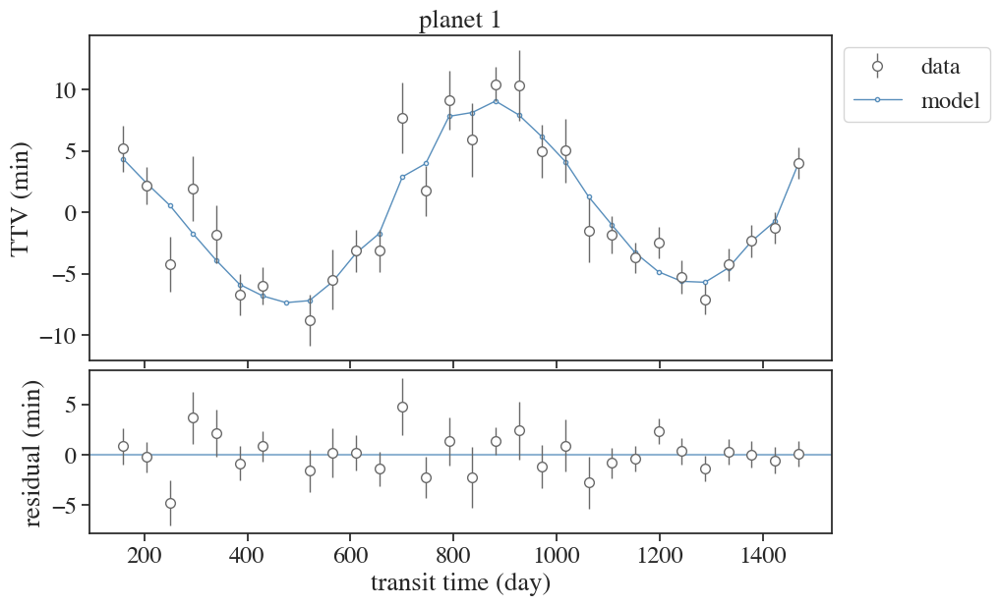

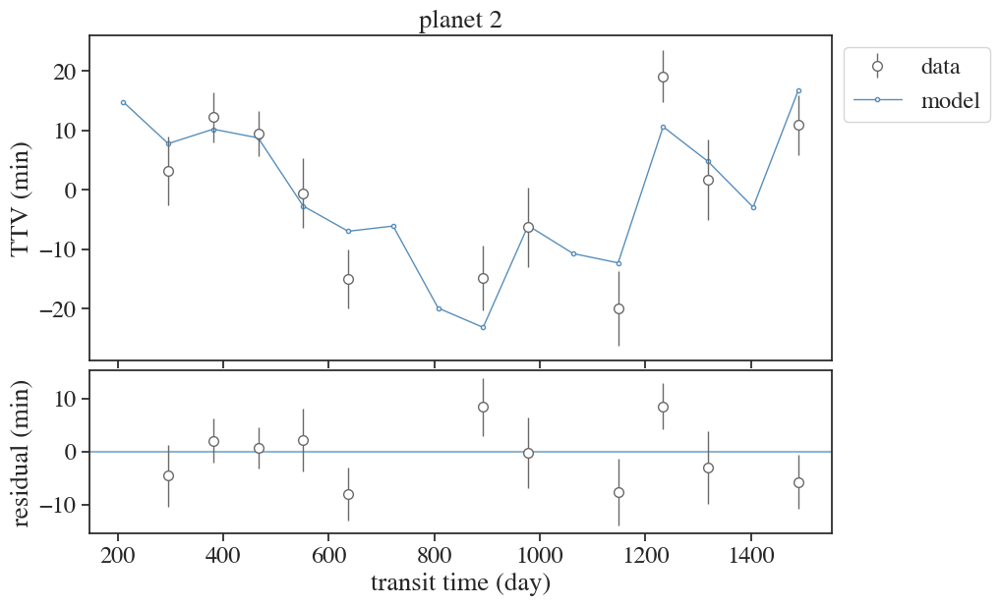

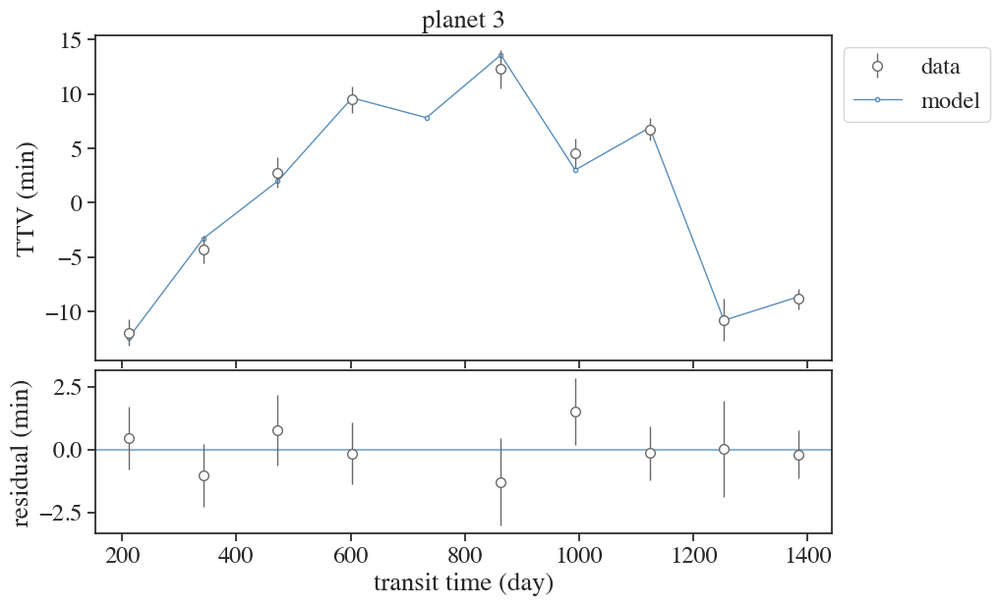

In [8]:
popt = ttv_optim_curve_fit(nt, param_bounds_ttv)

### transit parameter optimization

In [9]:
popt["smass"] = 1. # needs to add stellar mass

In [10]:
keys_ttv = ["ecosw", "esinw", "pmass", "period", "tic"]
keys_transit = ["radius_ratio", "b", "srad", "q1", "q2", "meanflux"]
param_bounds_transit = {
    "q1": [jnp.array(0), jnp.array(1.)],
    "q2": [jnp.array(0), jnp.array(1.)],
    "radius_ratio":  [jnp.zeros(3), jnp.ones(3)*0.15],
    "b": [jnp.zeros(3), jnp.ones(3)*1.5],
    "srad": [jnp.array(0.5), jnp.array(1.5)],
    "meanflux": [jnp.array(-1e-4), jnp.array(1e-4)]
}

In [11]:
import tinygp
from tinygp.kernels import quasisep as qk

def model_fix_ttv(par_dict, param_bounds_transit):
    par = {}

    for key in keys_ttv + ["smass"]:
        par[key] = par_dict[key]

    for key in keys_transit:
        par[key] = numpyro.sample(key, dist.Uniform(param_bounds_transit[key][0], param_bounds_transit[key][1]))
    
    fluxmodel_zeromean, tcmodel = nt.get_flux(par)
    numpyro.deterministic("tcmodel", tcmodel)
    fluxmodel = numpyro.deterministic("fluxmodel", fluxmodel_zeromean + par["meanflux"])
    residual = numpyro.deterministic("residual", flux_obs - fluxmodel)
    numpyro.deterministic("normed_residual", residual / error_obs)
    
    # GP likelihood
    lna = numpyro.sample("lna", dist.Uniform(low=-14, high=-4))
    lnc = numpyro.sample("lnc", dist.Uniform(low=-5, high=1))
    lnjitter = numpyro.sample("lnjitter", dist.Uniform(low=-14, high=-4))
    jitter = numpyro.deterministic("jitter", jnp.exp(lnjitter))
    kernel = qk.Matern32(sigma=jnp.exp(lna), scale=jnp.exp(lnc))
    gp = tinygp.GaussianProcess(kernel, nt.times_lc, diag=error_obs**2 + jitter**2, mean=0.0)
    numpyro.sample("obs", gp.numpyro_dist(), obs=residual)
    numpyro.deterministic("gppred", gp.predict(residual))

In [12]:
# optimize transit parameters alone
popt_transit = optim_svi(model_fix_ttv, 1e-2, 5000, par_dict=popt, param_bounds_transit=param_bounds_transit)

100%|██████████| 5000/5000 [00:29<00:00, 171.56it/s, init loss: -6514.7492, avg. loss [4751-5000]: -11085.7228]


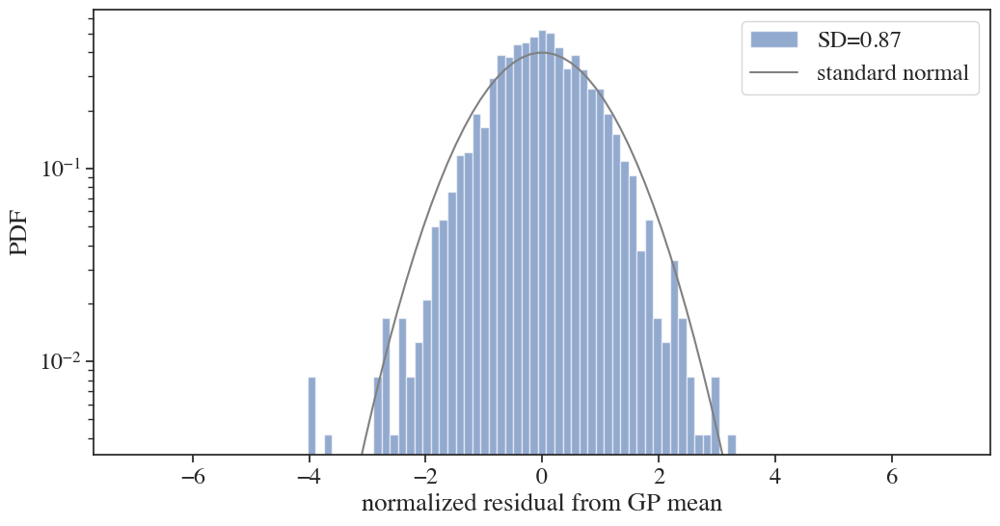

In [13]:
from scipy.stats import norm 
def check_residuals(p):
    bins = np.linspace(-7, 7, 100)
    plt.yscale("log")
    plt.xlabel("normalized residual from GP mean")
    res = (p['residual'] - p["gppred"]) / error_obs
    plt.hist(res, bins=bins, density=True, alpha=0.6, label="SD=%.2f"%np.std(res))
    plt.ylim(plt.gca().get_ylim())
    plt.plot(bins, norm.pdf(bins), color='gray', label='standard normal')
    plt.legend(loc='best')
    plt.ylabel("PDF");

check_residuals(popt_transit)

### optimizing full photodynamics model

In [14]:
popt_full = popt | popt_transit
param_bounds_full = param_bounds_ttv | param_bounds_transit
keys_full = keys_ttv + keys_transit

In [15]:
# add longitude of ascending node; prior Unif(-1, 1)
popt_full['lnode_inner'] = jnp.zeros(2)
keys_full.append('lnode_inner')
param_bounds_full['lnode_inner'] = [-1 * np.ones(2), np.ones(2)]

In [16]:
def model_full(keys, param_bounds, uniform_ecc=True, eps=1e-4):
    """full photodynamical model
        - stellar mass is fixed to 1Msun and only radius is floated, because only mean stellar density is constrained from this model;
          so pmass is mass ratio and stellar radius (srad) is in units of Rsun/(Mstar/Msun)**(1./3.)
        - impact parameters are restricted to be positive but this could be relaxed
        - longitude of ascending node (lnode) is measured with respect to the outermost transiting planet
    """
    # fix stellar mass to 1Msun without losing generality
    par = {"smass": 1.}

    # TTV & transit parameters
    for key in keys:
        par[key] = numpyro.sample(key, dist.Uniform(param_bounds[key][0], param_bounds[key][1]))
    par["lnode"] = numpyro.deterministic("lnode", jnp.hstack([par['lnode_inner'], 0.]))

    # Jacobian for uniform ecc prior
    if uniform_ecc:
        ecc = numpyro.deterministic("ecc", jnp.sqrt(par['ecosw']**2+par['esinw']**2))
        numpyro.factor("eprior", -jnp.log(ecc + eps))
    
    # compute model (tcmodel is not used)
    fluxmodel_zeromean, tcmodel = nt.get_flux(par)
    numpyro.deterministic("tcmodel", tcmodel)
    fluxmodel = numpyro.deterministic("fluxmodel", fluxmodel_zeromean + par["meanflux"])  
    residual = numpyro.deterministic("residual", flux_obs - fluxmodel)
    numpyro.deterministic("normed_residual", residual / error_obs)

    # GP likelihood  
    lna = numpyro.sample("lna", dist.Uniform(low=-14, high=-4))
    lnc = numpyro.sample("lnc", dist.Uniform(low=-5, high=1))
    lnjitter = numpyro.sample("lnjitter", dist.Uniform(low=-14, high=-4))
    jitter = numpyro.deterministic("jitter", jnp.exp(lnjitter))
    kernel = qk.Matern32(sigma=jnp.exp(lna), scale=jnp.exp(lnc))
    gp = tinygp.GaussianProcess(kernel, nt.times_lc, diag=error_obs**2 + jitter**2, mean=0.0)
    numpyro.sample("obs", gp.numpyro_dist(), obs=residual)
    numpyro.deterministic("gppred", gp.predict(residual))

In [17]:
popt_full = optim_svi(model_full, 1e-2, 5000, p_initial=popt_full, keys=keys_full, param_bounds=param_bounds_full)

100%|██████████| 5000/5000 [00:35<00:00, 139.53it/s, init loss: -11060.6508, avg. loss [4751-5000]: -11042.1021]


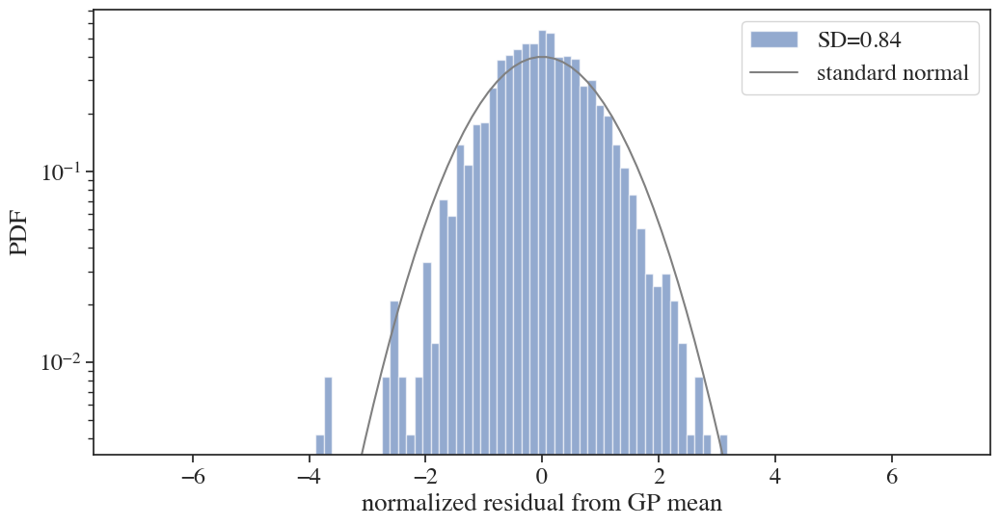

In [18]:
check_residuals(popt_full)

### running HMC

In [19]:
# initialize inverse mass matrix using parameter covariance
info = information_from_model_independent_normal(model=model_full, model_args=(keys_full, param_bounds_full), keys=keys_full, param_space="unconstrained",
                                                 pdic=popt_full, mu_name='fluxmodel', observed=flux_obs, sigma_sd=error_obs)
dense_mass = [tuple(keys_full)]
parameter_cov_unconstrained = jnp.linalg.inv(info['fisher'])
inverse_mass_matrix = {dense_mass[0]: parameter_cov_unconstrained}

In [20]:
kernel = NUTS(model_full, 
            init_strategy=init_to_value(values=popt_full), 
            dense_mass=dense_mass,
            inverse_mass_matrix=inverse_mass_matrix,
            max_tree_depth=10, # increase if num_steps keep hitting 2**max_tree_depth - 1
            target_accept_prob=0.8, # increase if there are many divergences
            regularize_mass_matrix=True, # set True if there are many divergences or if sampling breaks
            )

In [21]:
mcmc = MCMC(kernel, num_warmup=1000, num_samples=1000, num_chains=num_chains)
rng_key = random.PRNGKey(0)
mcmc.run(rng_key, keys_full, param_bounds_full, extra_fields=('potential_energy', 'num_steps', 'adapt_state'))

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

In [22]:
mcmc.print_summary()


                     mean       std    median      5.0%     95.0%     n_eff     r_hat
           b[0]      0.24      0.06      0.24      0.14      0.35    493.93      1.01
           b[1]      0.99      0.02      0.98      0.96      1.02    743.90      1.01
           b[2]      0.11      0.08      0.10      0.00      0.22    504.79      1.00
       ecosw[0]     -0.03      0.01     -0.03     -0.04     -0.01   1758.59      1.00
       ecosw[1]      0.01      0.01      0.00     -0.01      0.03   1409.26      1.00
       ecosw[2]      0.00      0.01     -0.00     -0.01      0.02   1307.01      1.00
       esinw[0]     -0.03      0.02     -0.03     -0.05     -0.01    705.84      1.00
       esinw[1]     -0.01      0.02     -0.00     -0.05      0.01    550.21      1.01
       esinw[2]     -0.01      0.02     -0.00     -0.04      0.01    545.98      1.01
            lna     -8.62      0.06     -8.62     -8.72     -8.51   2778.95      1.00
            lnc     -3.68      0.14     -3.68     -3.

### save chains

In [23]:
import arviz as az
idata = az.from_numpyro(mcmc)
idata.to_json("kep51_photodynamics_gp.json")

'kep51_photodynamics_gp.json'

array([[<Axes: title={'center': 'n_steps'}>,
        <Axes: title={'center': 'n_steps'}>]], dtype=object)

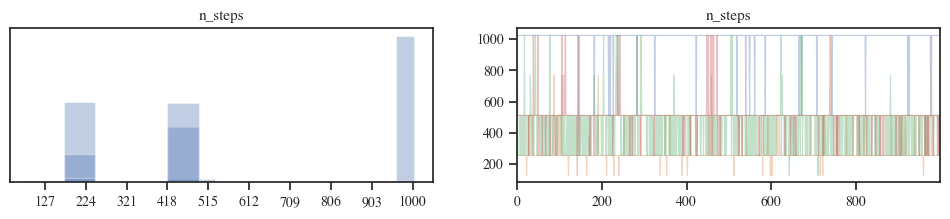

In [25]:
az.plot_trace(idata.sample_stats, var_names=['n_steps'], compact=False)

### trace and corner plots

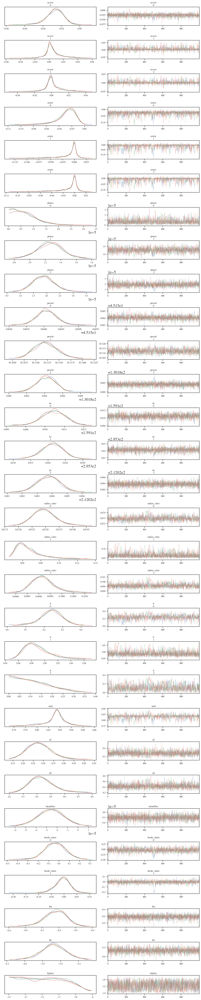

In [26]:
az.rcParams['plot.max_subplots'] = 100
keys_gp = ['lna', 'lnc', 'lnjitter']
fig = az.plot_trace(mcmc, var_names=keys_full+keys_gp, compact=False)
plt.tight_layout(pad=0.2)

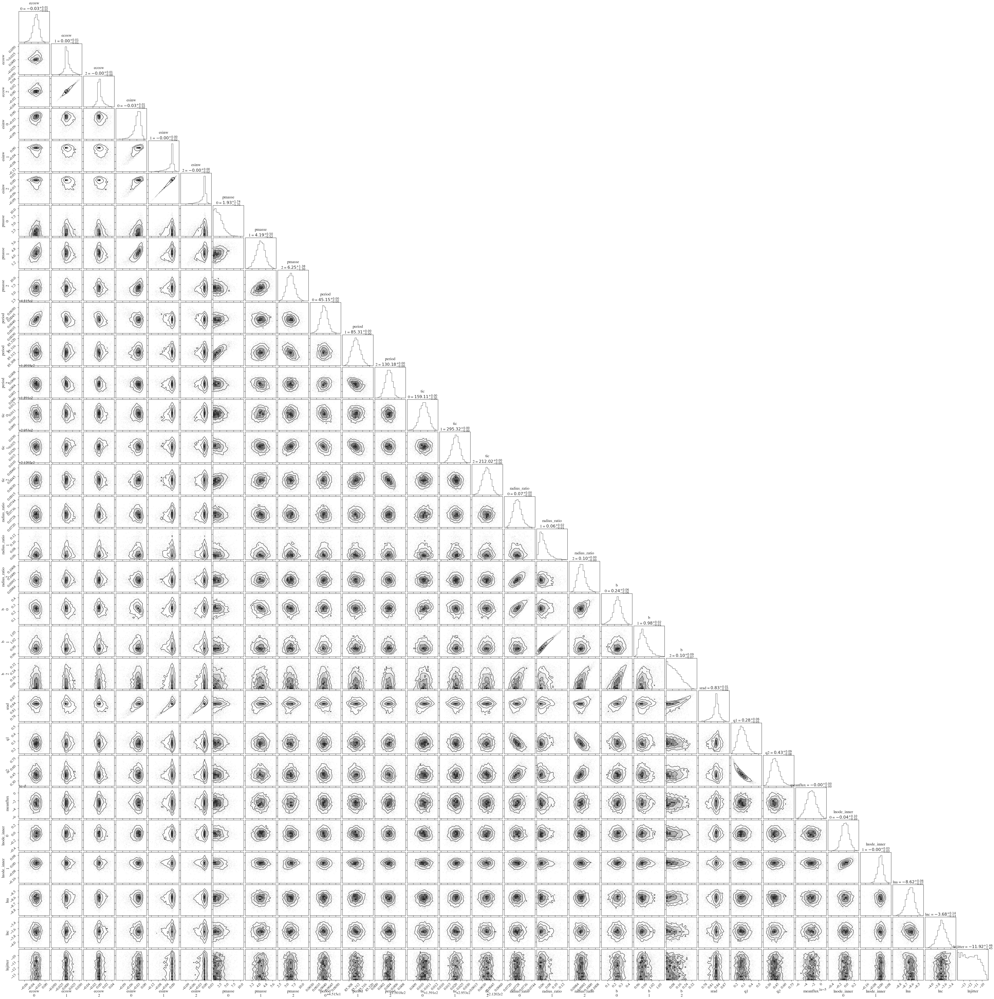

In [27]:
import corner
idata.posterior['pmasse'] = idata.posterior['pmass'] / 3.003e-6
keys_full_ = [key if key!="pmass" else "pmasse" for key in keys_full]
fig = corner.corner(idata, var_names=keys_full_+keys_gp, show_titles=True)

### plot light-curve models

In [28]:
samples = mcmc.get_samples()
models = samples['fluxmodel'] + samples['meanflux'][:,None]
gppreds = samples['gppred']
models_mean, models_sd = np.mean(models, axis=0), np.std(models, axis=0)
gp_mean, gp_sd = np.mean(gppreds, axis=0), np.std(gppreds, axis=0)

In [29]:
from scipy.stats import binned_statistic

def bin_light_curve(time, flux, bin_width=2.0/1440.):
    """
    Bin the light curve by computing the mean flux in each time bin.

    Parameters:
    - time: array-like, time values (unevenly spaced)
    - flux: array-like, flux measurements corresponding to time
    - bin_width: float, width of each time bin in the same units as time (default: 2.0)

    Returns:
    - bin_centers: array of bin center times
    - binned_flux: array of mean flux values per bin
    - bin_counts: number of points per bin
    """

    # Define bin edges
    t_min, t_max = np.min(time), np.max(time)
    bins = np.arange(t_min, t_max + bin_width, bin_width)

    # Compute binned statistics
    binned_flux, bin_edges, binnumber = binned_statistic(time, flux, statistic='median', bins=bins)
    bin_counts, _, _ = binned_statistic(time, flux, statistic='count', bins=bins)

    # Compute bin centers
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2.

    return bin_centers, binned_flux, bin_counts


def plot_lcmodels(nt, models_mean, gp_mean, markersize=5):
    t_bin, f_bin, counts = bin_light_curve(time_obs, flux_obs, 30./1440.)
    idx_ = counts > 5
    t_bin, f_bin = t_bin[idx_], f_bin[idx_]
    tres_bin, fres_bin, counts = bin_light_curve(time_obs, flux_obs-models_mean-gp_mean, 30./1440.)
    idx_ = counts > 5
    tres_bin, fres_bin = tres_bin[idx_], fres_bin[idx_]

    scale = 1e3
    rows, col = [len(nt.tcobs[j])//5+1 for j in range(len(nt.tcobs))], 5
    plnames = [f'planet{i}+1' for i in range(len(nt.tcobs))]
    for j in range(len(plnames)):
        fig, axes = plt.subplots(rows[j], col, sharey=True, figsize=(12, rows[j]*2))
        fig.text(0.5, -0.01, 'time (days)', ha='center', fontsize=24)
        fig.text(-0.03, 0.5, r'relative flux ($\times 10^{-3}$)', va='center', rotation='vertical', fontsize=24)
        tcs = nt.tcobs[j]

        for k,tc in enumerate(tcs):
            ax = axes[k // col, k % col]
            idx = np.abs(time_obs - tc) < 0.5
            if not np.sum(idx):
                continue

            t_, f_ = time_obs[idx], flux_obs[idx]*scale
            ax.set_xlim(t_[0], t_[-1])
            ax.plot(t_, f_, '.', alpha=0.5, color='gray', label='data', markersize=markersize)
            idxb = np.abs(t_bin - tc) < 0.5
            ax.plot(t_bin[idxb], f_bin[idxb]*scale, 'o', markersize=3, mfc='white', color='gray')
            
            fm0 = models_mean[idx]
            mu = (models_mean + gp_mean)[idx]
            #sigma = (models_sd + gp_sd)[idx]
            ax.plot(t_, mu*scale, '-', color='C1', lw=1)
            #ax.fill_between(t_, (mu-sigma)*scale, (mu+sigma)*scale, color='C1', alpha=0.2)

            offset = -1.2 * np.min(f_) + 7 * np.std(f_ - mu*scale)
            ax.plot(t_, (f_-mu*scale)-offset, '.', alpha=0.5, color='gray', label='data', markersize=markersize)
            ax.axhline(y=-offset, color='C1', lw=1)
            idxb = np.abs(tres_bin - tc) < 0.5
            ax.plot(tres_bin[idxb], fres_bin[idxb]*scale-offset, 'o', markersize=3, mfc='white', color='gray')

        for kdel in range(k+1, rows[j]*col):
            fig.delaxes(axes[kdel // col, kdel % col])
        fig.tight_layout(pad=0.02)


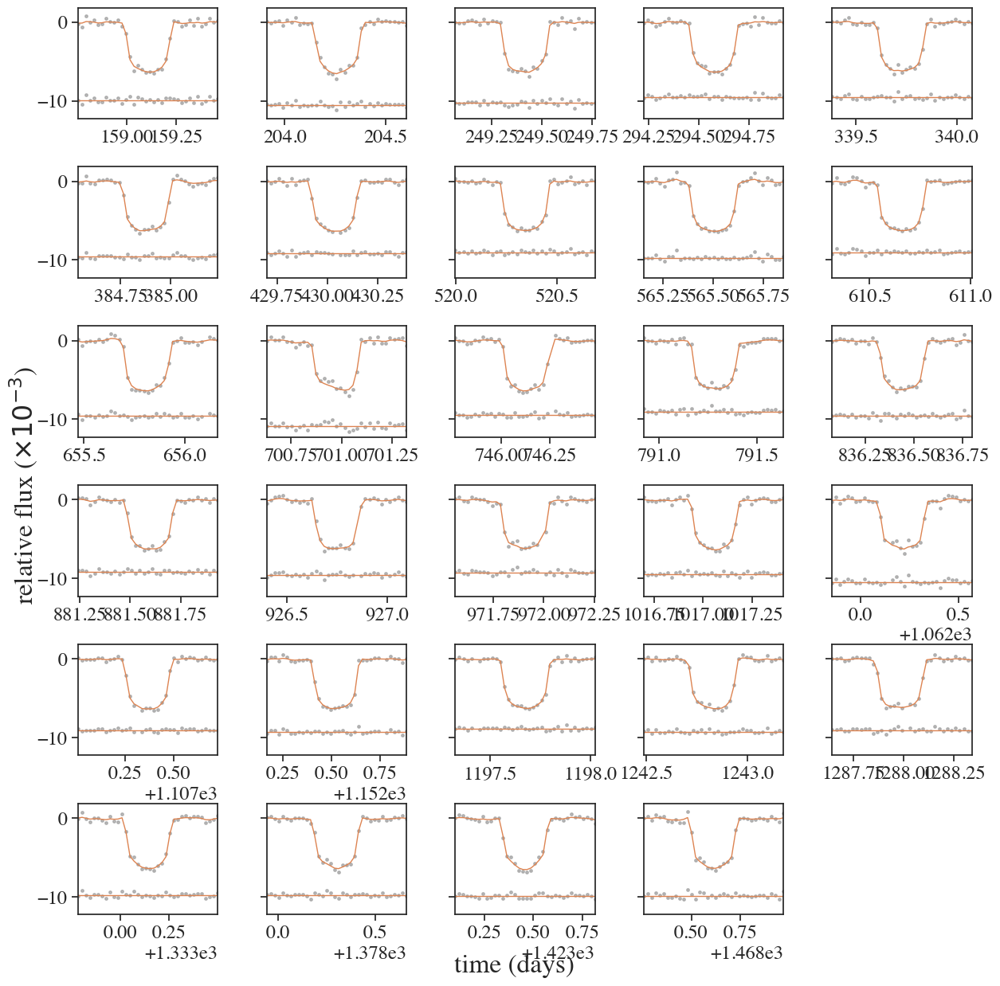

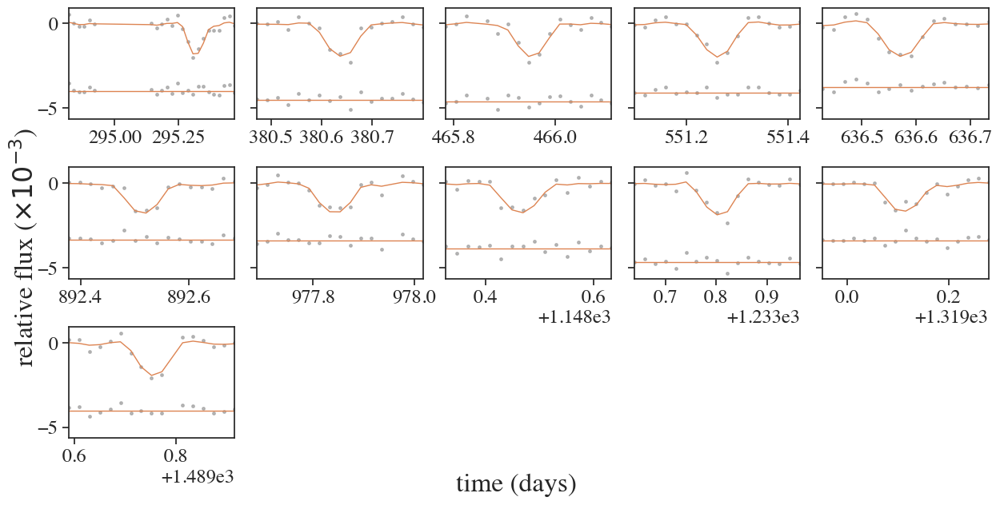

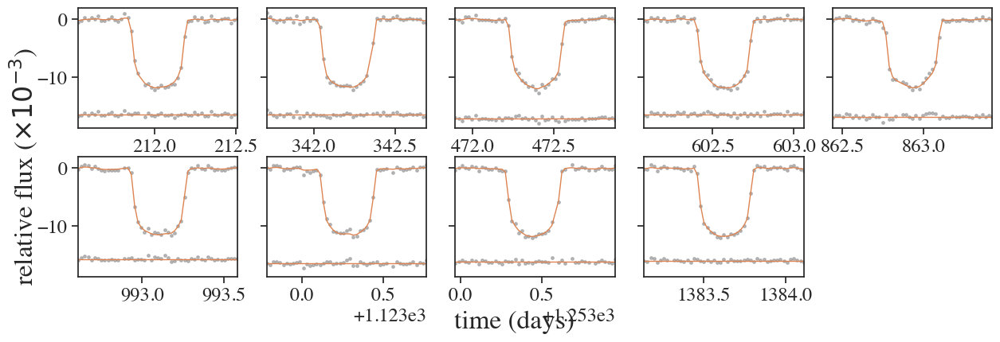

In [30]:
plot_lcmodels(nt, models_mean, gp_mean)